
# Image Analysis Techniques
## - By Aditya Mohan

This notebook demonstrates some image analysis/processing techniques applied on an image I captured when I visited Singapore. Enjoy!

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from pylab import *
from PIL import Image
import cv2

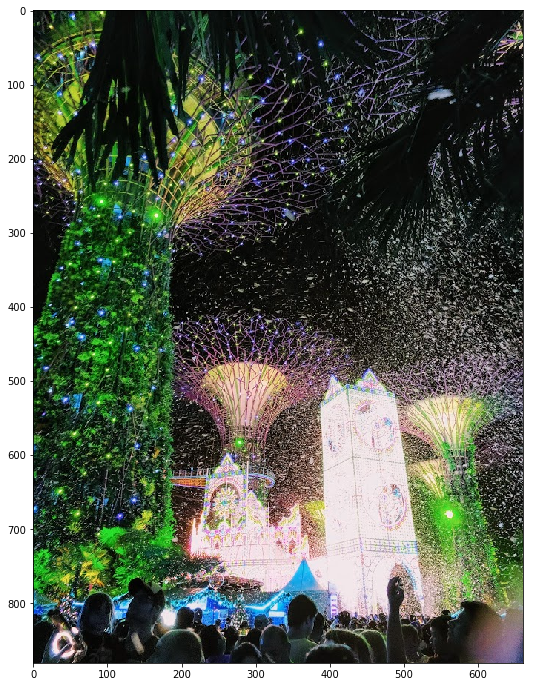

In [83]:
#The original image of Singapore's Christmas Wonderland:

orig = cv2.imread("C:\\Users\\Aditya Mohan\\Pictures\\CV\\sg.jpg")
fig = plt.figure(figsize=(12, 12))
plt.imshow(orig)
plt.show()

In [5]:
im1 = np.array(orig)

In [6]:
# Converting the colored image into grayscale:

im2 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)

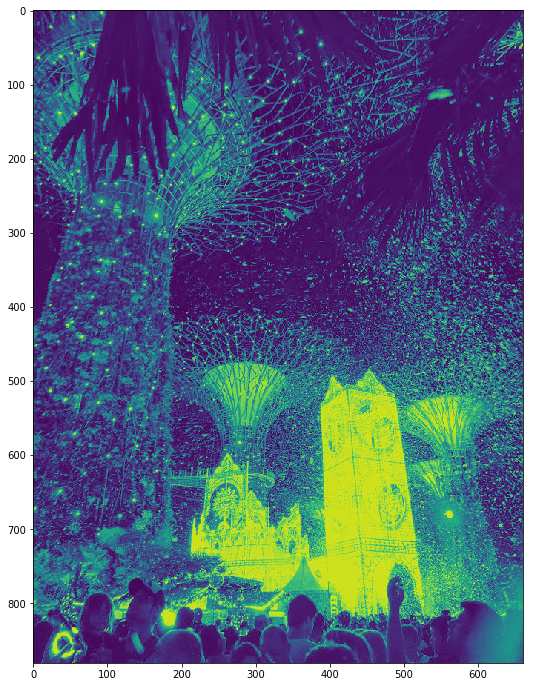

In [84]:
fig = plt.figure(figsize=(12, 12))
plt.imshow(im2)
plt.show()

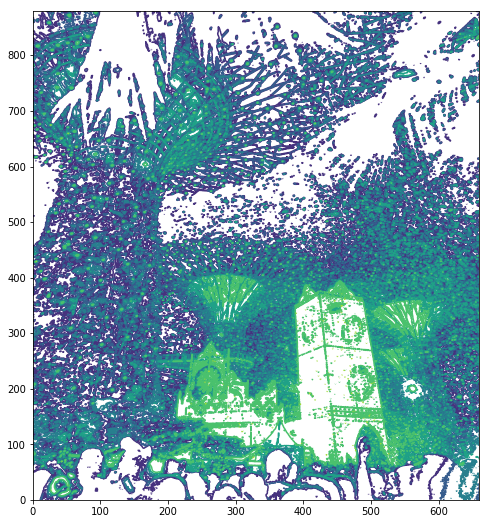

In [89]:
#Applying Contours

fig = plt.figure(figsize=(8, 9))
contour(im2,origin='image')
plt.show()

In [90]:
#Printing the Shape

shp = im2.shape
row, col = im2.shape
print(shp)

(881, 661)


In [91]:
# Adding Noise to the image

sigma = 25
noise = np.random.normal(0 , sigma, (row,col))
im3 =  im2 + noise

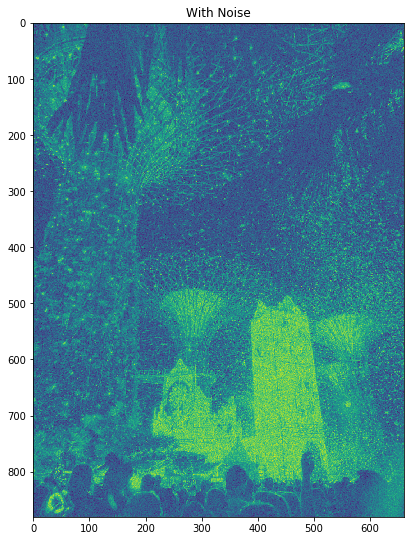

In [93]:
fig = plt.figure(figsize=(20, 20))

a = fig.add_subplot(2,2,1)
imgplot = plt.imshow(im3)
a.set_title('With Noise')

plt.show()

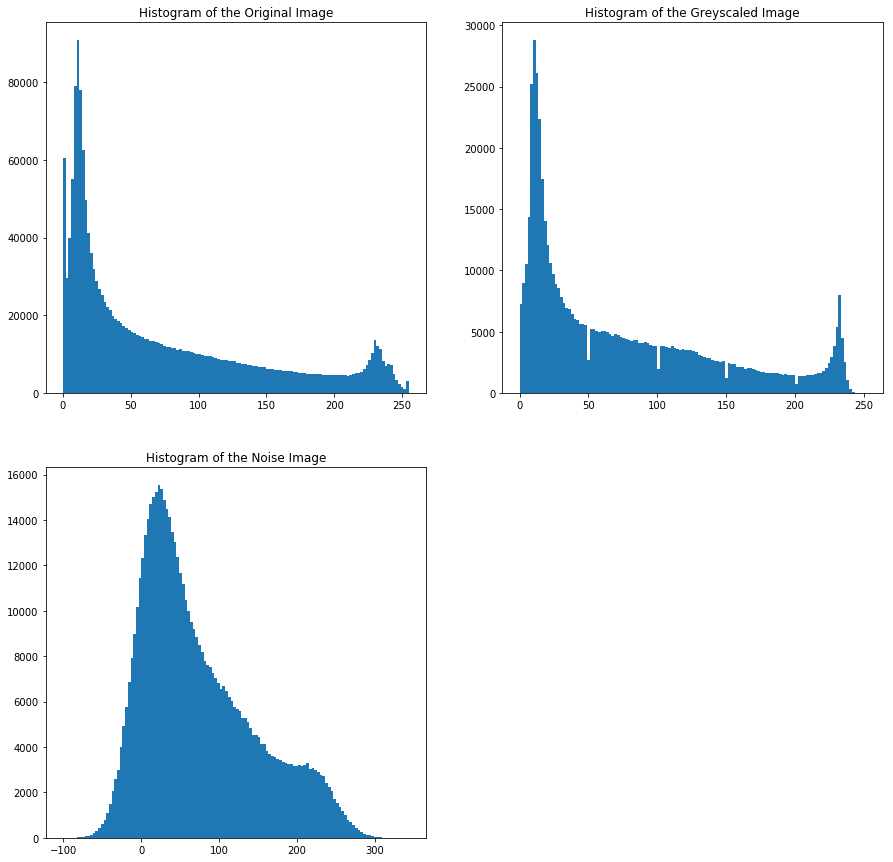

In [28]:
#Histogram to show frequency of each pixel intensity value

fig = plt.figure(figsize=(15, 15))

a = fig.add_subplot(2,2,1)
hist(orig.flatten(),128)
a.set_title('Histogram of the Original Image')


b = fig.add_subplot(2,2,2)
hist(im2.flatten(),128)
b.set_title('Histogram of the Greyscaled Image')


c = fig.add_subplot(2,2,3)
hist(im3.flatten(),128)
c.set_title('Histogram of the Noise Image')


plt.show()


In [94]:
import matplotlib

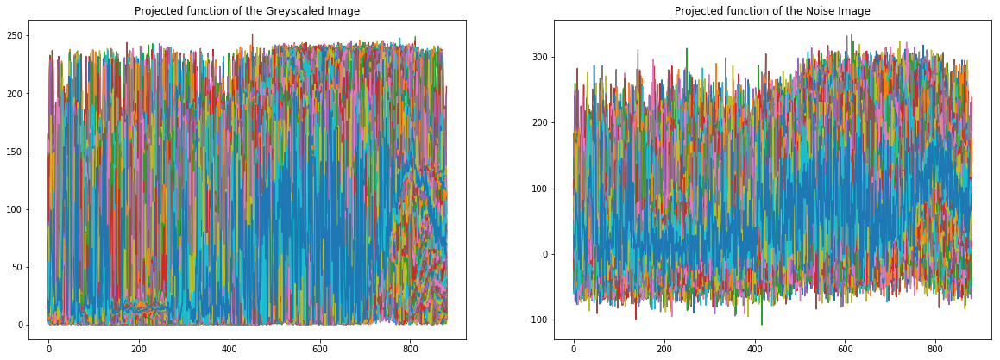

In [95]:
fig = plt.figure(figsize=(20, 15))



a = fig.add_subplot(2,2,1)
plt.plot(im2)
a.set_title('Projected function of the Greyscaled Image')



b = fig.add_subplot(2,2,2)
plt.plot(im3)
b.set_title('Projected function of the Noise Image')


plt.show()

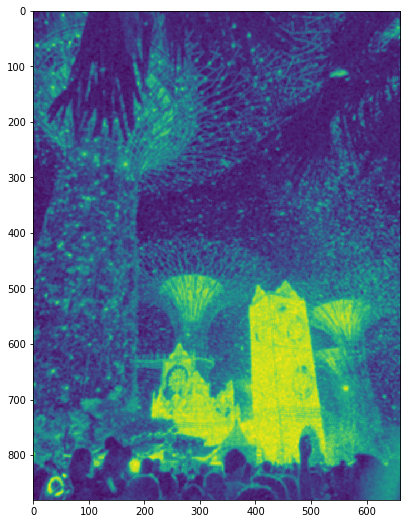

In [97]:
#Smoothen Picture - Using a Averaging Filter

blur = cv2.blur(im3,(5,5),0)
fig = plt.figure(figsize=(8, 9))
imshow(blur)
plt.show()

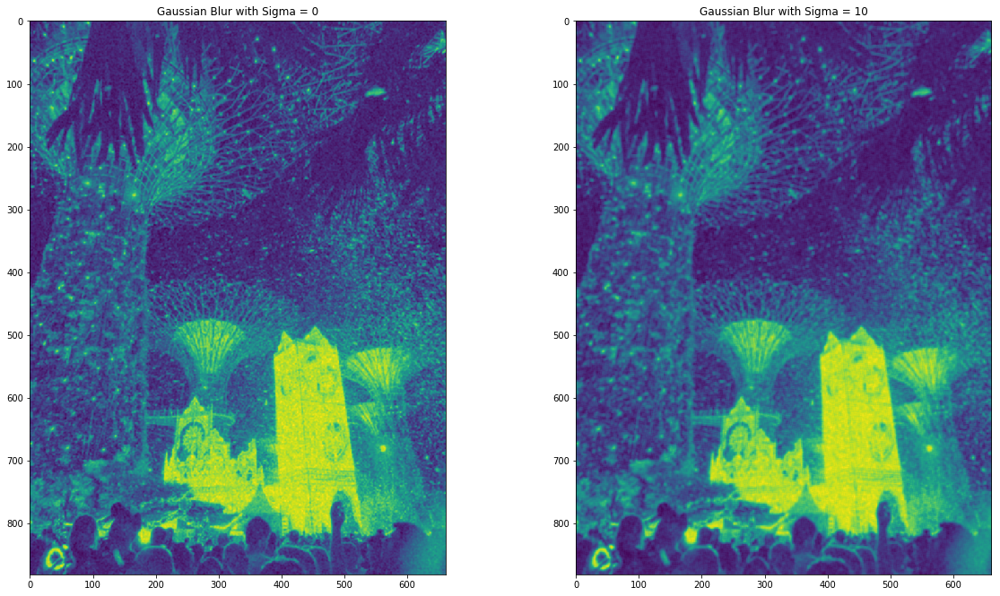

In [75]:
#Smoothen Picture - Using a Gaussian Filter

fig = plt.figure(figsize=(20, 25))



a = fig.add_subplot(2,2,1)
blur_0 = cv2.GaussianBlur(im3,(5,5),0,0)
a.set_title('Gaussian Blur with Sigma = 0')
imshow(blur_0)

b = fig.add_subplot(2,2,2)
blur_10 = cv2.GaussianBlur(im3,(5,5),10,10)
b.set_title('Gaussian Blur with Sigma = 10')
imshow(blur_10)


plt.show()

In [35]:
pil_orig = Image.fromarray(orig)
fig = plt.figure(figsize=(20, 15))
pil_im3= Image.fromarray(im3)

<Figure size 1440x1080 with 0 Axes>

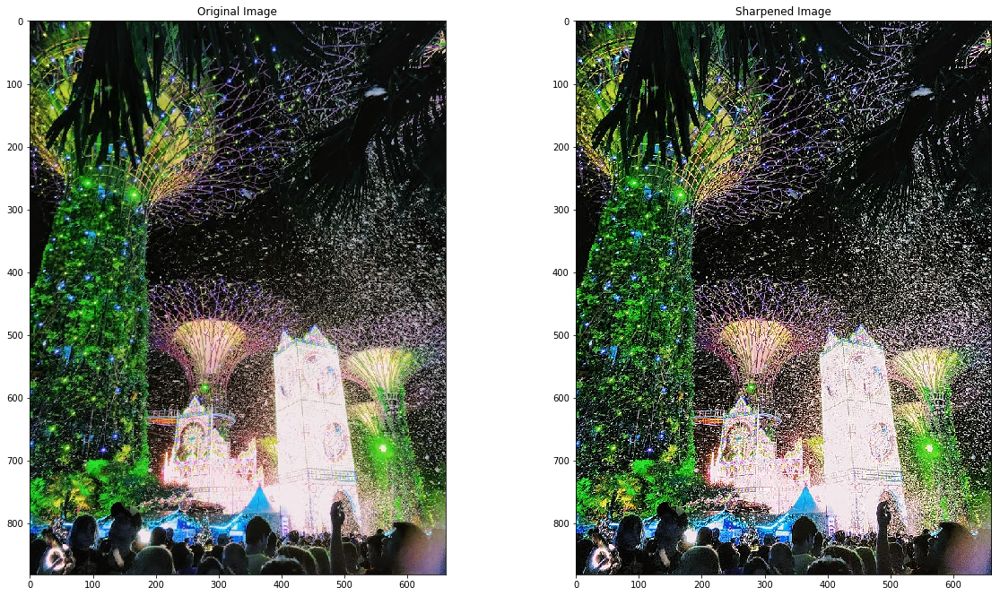

In [77]:
# Sharpen Image

from PIL import Image, ImageFilter
fig = plt.figure(figsize=(20, 25))

a = fig.add_subplot(2,2,1)
a.set_title('Original Image')
imshow(orig)

b = fig.add_subplot(2,2,2)
sharpened = pil_orig.filter(ImageFilter.SHARPEN)
b.set_title('Sharpened Image')
imshow(sharpened)

plt.show()

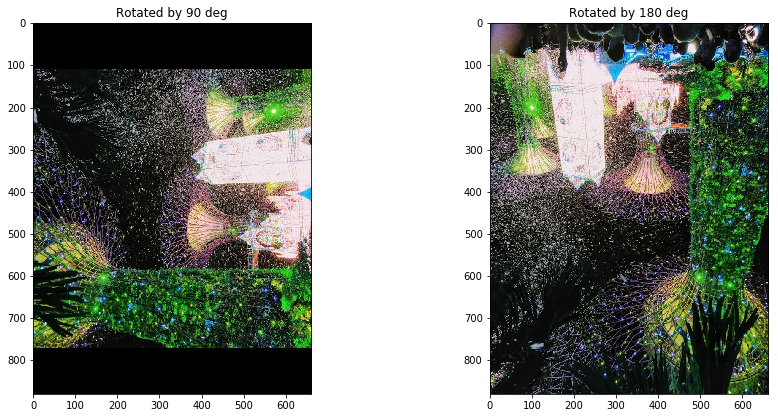

In [41]:
#Rotate Image

fig = plt.figure(figsize=(15, 15))


a = fig.add_subplot(2,2,1)
rot_orig = pil_orig.rotate(90)
a.set_title('Rotated by 90 deg')
plt.imshow(rot_orig)

b = fig.add_subplot(2,2,2)
rot_orig = pil_orig.rotate(180)
b.set_title('Rotated by 180 deg')
plt.imshow(rot_orig)


plt.show()


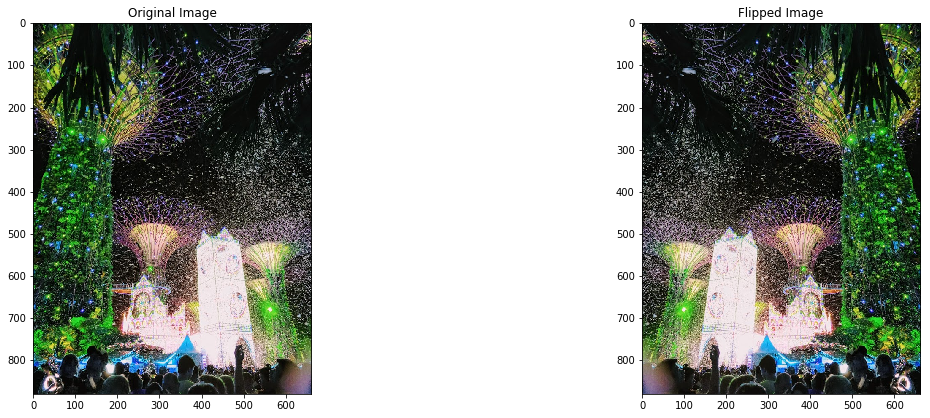

In [42]:
# Flipped Image
fig = plt.figure(figsize=(20, 15))


a = fig.add_subplot(2,2,1)
a.set_title('Original Image')
plt.imshow(orig)

b = fig.add_subplot(2,2,2)
flip_orig = np.flip(orig,axis=1)
plt.imshow(flip_orig)
b.set_title('Flipped Image')
plt.imshow(flip_orig)



plt.show()

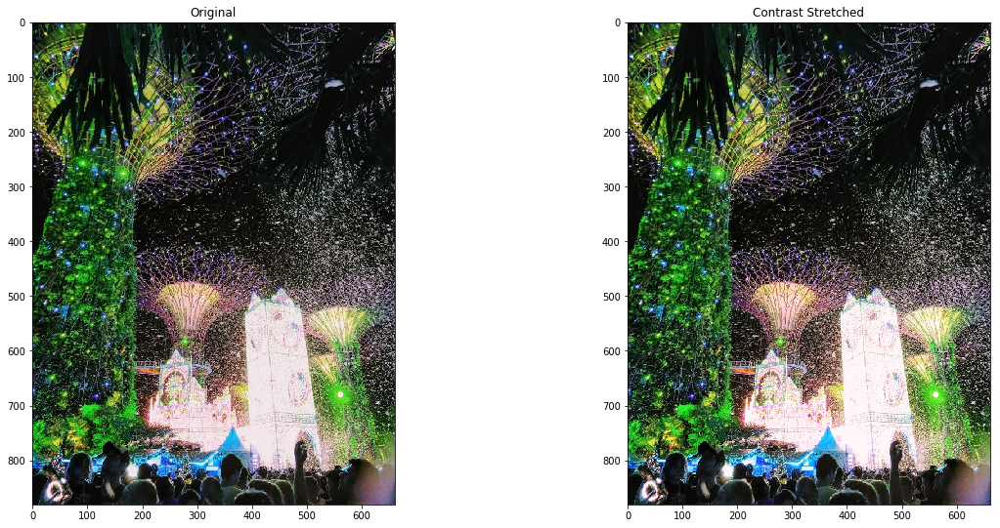

In [46]:
#Contrast Stretching

from skimage import exposure
p2 = np.percentile(orig, 2)
p98 = np.percentile(orig, 98)
orig_ct = exposure.rescale_intensity(orig, in_range=(p2, p98))

fig = plt.figure(figsize=(20, 20))

a = fig.add_subplot(2,2,1)
imgplot = plt.imshow(orig)
a.set_title('Original')

b = fig.add_subplot(2,2,2)
imgplot = plt.imshow(orig_ct)
b.set_title('Contrast Stretched')

plt.show()

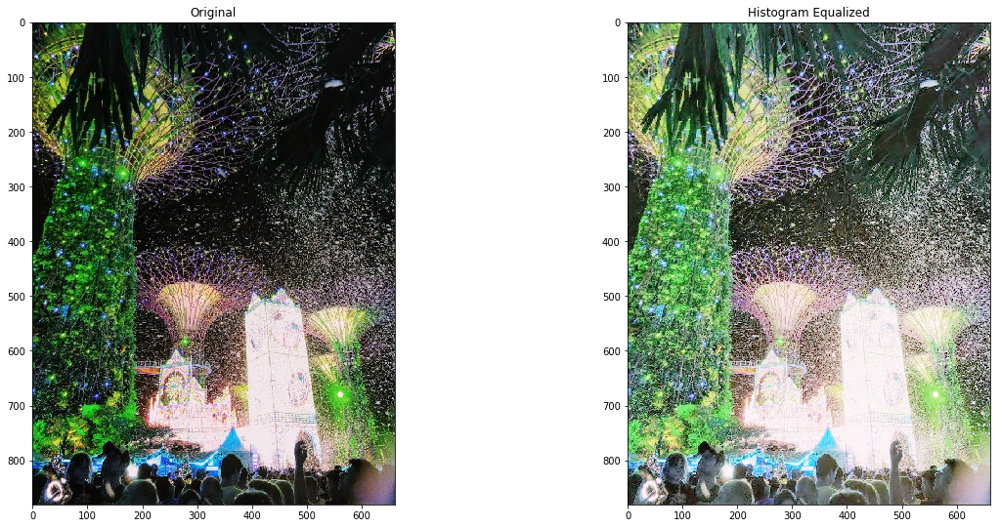

In [47]:
#Histogram Equalizer

orig_eq = exposure.equalize_hist(orig)

fig = plt.figure(figsize=(20, 20))

a = fig.add_subplot(2,2,1)
imgplot = plt.imshow(orig)
a.set_title('Original')

b = fig.add_subplot(2,2,2)
imgplot = plt.imshow(orig_eq)
b.set_title('Histogram Equalized')

plt.show()

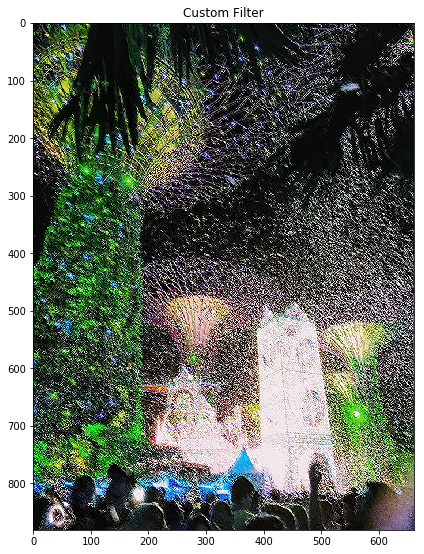

In [81]:
#Custom Filter

custom_kernel = (200, -200, -100,
                 -200, 200, -100,
                  -100, -50, 200)

filtered_image = pil_orig.filter(ImageFilter.Kernel((3,3), custom_kernel))

fig = plt.figure(figsize=(15, 12))

a=fig.add_subplot(1, 2, 2)
image_plot_2 = plt.imshow(filtered_image)
a.set_title("Custom Filter")
plt.show()

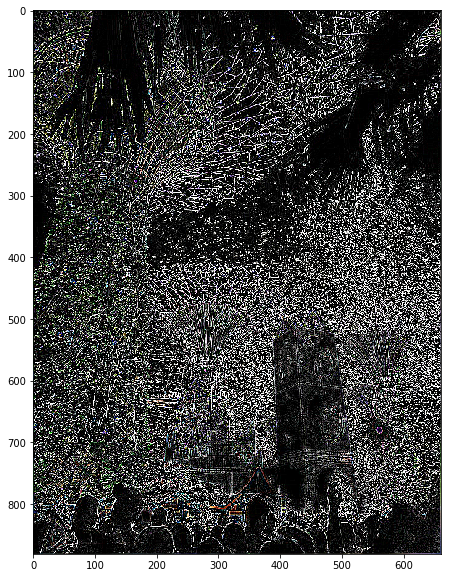

In [53]:
# Detect Edges

fig = plt.figure(figsize=(10, 10))

from PIL import Image, ImageFilter
edges_orig = pil_orig.filter(ImageFilter.FIND_EDGES)
imshow(edges_orig)
plt.show()

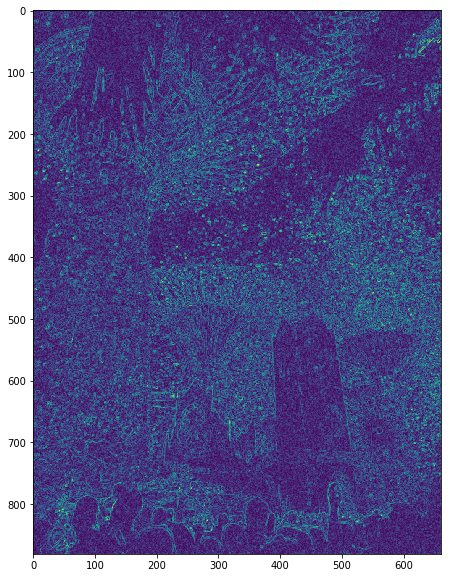

In [54]:
#Sobel edge detection method

from scipy import ndimage
import skimage.color as sc
import numpy as np
pil_im2= Image.fromarray(im3)
def sobel_edge(image):
        dx = ndimage.sobel(image, 1) #Horizontal Derivative
        dy = ndimage.sobel(image, 0) #Vertical Derivative
        mag = np.hypot(dx,dy)
        mag = mag * 255.0/np.amax(mag) #Normalize
        mag = mag.astype(np.uint8)
        return mag
    
sobel_orig = sobel_edge( np.array(pil_im2) )


fig = plt.figure(figsize=(10,10))

imshow(sobel_orig)
plt.show()